# Analiza zagrożeń atakami piratów
## Autorzy
- Dorota Karpińska 251542
- Mateusz Kupis 251565
- Gabriela Szczuka 251645
## Cel analizy

Identyfikacja obszarów o podwyższonym ryzyku wystąpienia ataków pirackich.

In [2]:
import geopandas as gpd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx
import xyzservices
import folium
from folium.plugins import HeatMapWithTime
from folium.plugins.marker_cluster import MarkerCluster
import branca.colormap as cm
import leafmap.foliumap as leafmap

### Wczytywanie danych
1. `ports` - przedstawia ogólne dane dotyczące portów morskich na świecie. Zawiera informacje o lokalizacji, funkcjach spełnianych przez port oraz o przepustowości.
2. `lanes` - w geometrii MULTILINESTRING przechowuje przebieg trzech głównych typów tras morskich.
3.  `pirates` - zawiera dane o incydentach ataków pirackich na przestrzeni lat 1993 - 2020. Opis zdarzenia zawiera: położenie, datę, typ ataku itd. Część danych została pominięta w analizie ze względu na brak istotności dla zdarzenia lub dużą liczbę brakujących odczytów.

In [3]:
ports = gpd.read_file('attributed_ports.geojson')
lanes = gpd.read_file('Shipping_Lanes_v1.geojson')
pirates = pd.read_csv('pirate_attacks.csv')

In [4]:
# ports
ports_wm = ports.to_crs(epsg=3857)

# lanes
lanes_wm = lanes.to_crs(epsg=3857)

# pirates
pirates['date'] = pd.to_datetime(pirates['date'])
pirates['attack_type'] = pirates['attack_type'].fillna('Unknown')
pirates = pirates.sort_values(by=['date'])

pirates_gdf = gpd.GeoDataFrame(
    pirates,
    geometry=gpd.points_from_xy(pirates.longitude, pirates.latitude),
    crs="EPSG:4326"
)
pirates_wm = pirates_gdf.to_crs(epsg=3857)

### Podział portów pod względem przepustowości
Wizualizacja przedstawia globalną sieć infrastruktury portowej, ukazując rozmieszczenie portów morskich na wszystkich kontynentach. Każdy punkt na mapie odpowiada pojedynczemu portowi, natomiast jego wielkość oraz kolor bezpośrednio odzwierciedlają poziom przepustowości, rozumiany jako liczby statków wypływających z danego portu.

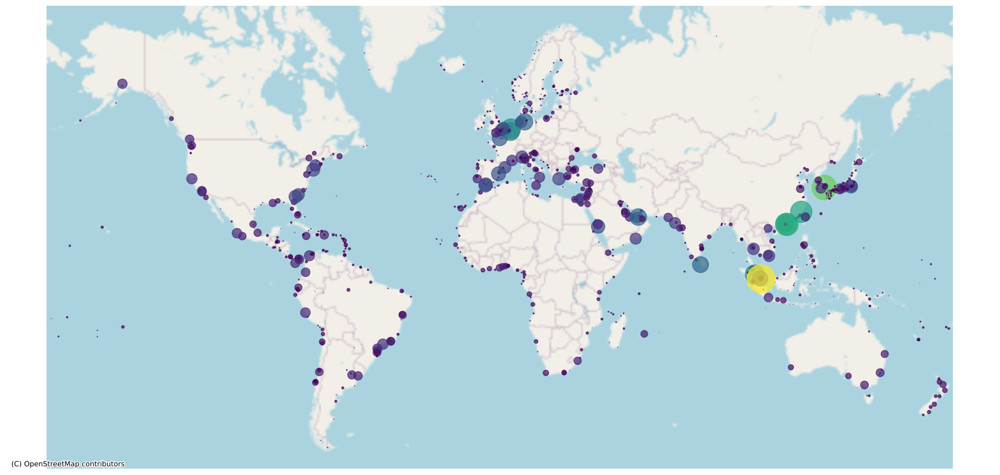

In [5]:
max_point_size = 1000
marker_sizes = (ports_wm['outflows'] / ports_wm['outflows'].max()) * max_point_size

fig, ax = plt.subplots(figsize=(20, 16))

ports_wm.plot(
    'outflows', ax=ax,
    markersize=marker_sizes,
    alpha=0.7,
    cmap='viridis',
)
ax.set_axis_off()
ax.set_facecolor('white')
fig.patch.set_facecolor('white')
ctx.add_basemap(ax, source=xyzservices.providers.OpenStreetMap.Mapnik)

fig.savefig('mapy/porty.png')
plt.show()

### Podział tras morskich pod względem znaczenia
Mapa przedstawia główne światowe trasy morskie, z uwzględnieniem ich znaczenia w globalnym systemie transportu morskiego. Szlaki zostały sklasyfikowane według wagi i intensywności ruchu na trzy kategorie: major, middle oraz minor.
Każdej kategorii odpowiada zróżnicowana grubość linii, która w sposób wizualny odzwierciedla poziom natężenia żeglugi oraz znaczenie danej trasy dla międzynarodowego handlu. Najgrubsze linie wskazują kluczowe szlaki (major), łączące najważniejsze regiony gospodarcze świata, natomiast cieńsze linie reprezentują trasy o średnim i mniejszym znaczeniu, pełniące funkcje uzupełniające i regionalne.

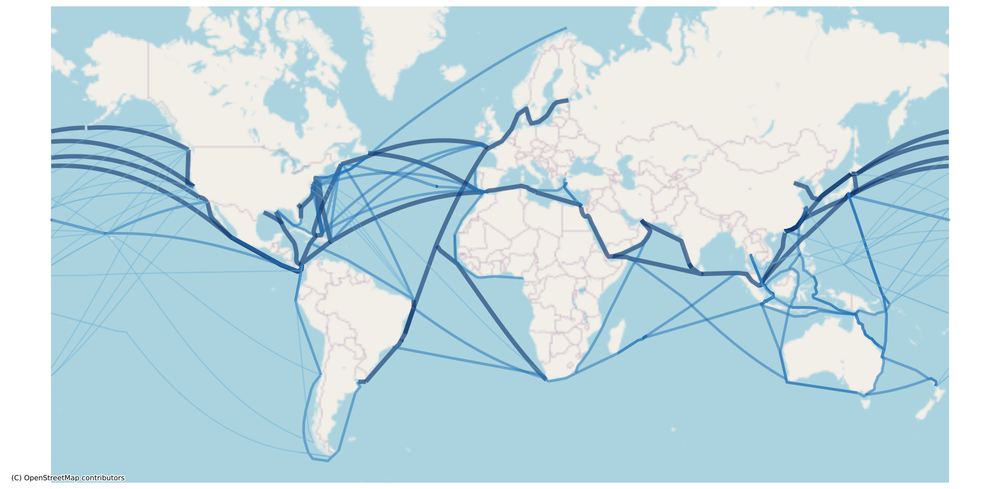

In [6]:
fig, ax = plt.subplots(figsize=(20, 16))

styles = {
    'Major': (5.0, 0.6, '#08306b'),
    'Middle': (3.0, 0.5, '#2171b5'),
    'Minor': (1.5, 0.4, '#6baed6'),
}

for r_type, data in lanes_wm.groupby('Type'):
    lw, alpha, color = styles.get(r_type)

    data.plot(
        ax=ax,
        color=color,
        linewidth=lw,
        alpha=alpha,
        zorder=2,
        label=r_type
    )
ax.set_axis_off()
ax.set_facecolor('white')
fig.patch.set_facecolor('white')
ctx.add_basemap(ax, source=xyzservices.providers.OpenStreetMap.Mapnik)

fig.savefig('mapy/trasy_morskie.png')
plt.show()

### Wystąpienia ataków pirackich z uwzględnieniem typu ataku
Mapa przedstawia lokalizację zarejestrowanych ataków na jednostki morskie. Zdarzenia są zgrupowane w klastry, które rozdzielają się na pojedyncze markery po powiększeniu mapy. Każdy kolor ikony oznacza inny typ ataku, np. ostrzelanie, abordaż czy zdarzenie podejrzane. Wizualizacja pozwala szybko zidentyfikować rejony o największej liczbie ataków oraz sprawdzić, jakie rodzaje zagrożeń dominują w danym obszarze. Dzięki temu można analizować zarówno zagęszczenie, jak i charakter zagrożeń na kluczowych szlakach transportowych.

In [7]:
m = leafmap.Map(center=(7.369722, 12.354722), zoom_start=2)
pirate_cluster = MarkerCluster(name='Pirates', show=True).add_to(m)

attack_type = {
    'Attempted': 'beige',
    'Boarded': 'lightgreen',
    'Boarding': 'darkgreen',
    'Detained': 'darkblue',
    'Explosion': 'red',
    'Fired Upon': 'orange',
    'Hijacked': 'purple',
    'Suspicious': 'blue',
    'Unknown': 'gray',
}

attack_legend = {
    'Attempted': '#FFCA92',
    'Boarded': '#BBF970',
    'Boarding': '#728224',
    'Detained': '#0066A2',
    'Explosion': '#D53E2A',
    'Fired Upon': '#F69730',
    'Hijacked': '#D152B8',
    'Suspicious': '#38A9DC',
    f'Unknown': '#575757',
}
attack_legend = {f'{key} ({value})': attack_legend[str(key)] for key, value in dict(pirates.groupby('attack_type').size()).items()}

m.add_legend(title="Attack types (count)", legend_dict=attack_legend)

for i in pirates.itertuples():
    popup_content = f"""
    <b>Date:</b> {i.date.date()}<br>
    <b>Lat:</b> {i.latitude:.4f}<br>
    <b>Lon:</b> {i.longitude:.4f}<br>
    <b>Type:</b> {i.attack_type}
    """

    folium.Marker(
        location=(i.latitude, i.longitude),
        popup=folium.Popup(popup_content, max_width=300),
        icon=folium.Icon(
            icon="skull-crossbones",
            prefix="fa",
            color=attack_type.get(i.attack_type, 'gray'))
    ).add_to(pirate_cluster)
m.save('mapy/ataki_piratow.html')
m

### Czasowy rozkład ataków
Mapa cieplna przedstawia przestrzenne i czasowe zróżnicowanie intensywności ataków pirackich na świecie w latach 1993–2020. Kolorystyka mapy odzwierciedla częstotliwość zdarzeń – im ciemniejszy lub bardziej nasycony kolor, tym większa liczba odnotowanych ataków w danym obszarze i okresie czasu.
Zastosowanie heatmapy z wymiarem czasowym umożliwia nie tylko identyfikację obszarów szczególnie narażonych na piractwo, lecz także obserwację długoterminowych trendów i zmian dynamiki zagrożeń morskich w badanym okresie.

In [8]:
with_time_locations = []
time_index = []

for time_period, group in pirates.groupby(by=pirates['date'].dt.year):
    time_index.append(str(time_period))
    with_time_locations.append(group[['latitude', 'longitude']].values.tolist())

In [9]:
m = folium.Map((7.369722, 12.354722), zoom_start=2)

HeatMapWithTime(
    with_time_locations,
    index=time_index,
    auto_play=True,
    name='HeatMap with Time',
    max_opacity=0.6,
    radius=15
).add_to(m)
m.save('mapy/ataki_piratow_przez_lata.html')
m

### Oznaczenie portów pod względem zagrożenia
Mapa przedstawia porty morskie oznaczone kolorami zgodnie z liczbą ataków pirackich, które miały miejsce w ich bezpośrednim sąsiedztwie. Intensywność koloru odzwierciedla skalę zagrożenia – im bardziej nasycony kolor, tym większa liczba odnotowanych incydentów w pobliżu danego portu.
Do analizy uwzględniono wyłącznie zdarzenia zlokalizowane w promieniu do 100 km od portów, co pozwala skupić się na atakach potencjalnie wpływających na bezpieczeństwo danej jednostki. Takie ograniczenie zwiększa precyzję oceny ryzyka i eliminuje zdarzenia odległe, niemające bezpośredniego znaczenia dla funkcjonowania portów.

In [10]:
pirates_ports = pirates_wm.sjoin_nearest(ports_wm, max_distance=100_000, distance_col='p_dist')

attacks_counts = pirates_ports.groupby('index_right').size().reset_index(name='attack_count')

ports_with_data = ports.loc[attacks_counts['index_right']].copy()
ports_with_data['attack_count'] = attacks_counts['attack_count'].values

center_lat = ports_with_data.geometry.y.mean()
center_lon = ports_with_data.geometry.x.mean()
m = folium.Map((7.369722, 12.354722), zoom_start=2)

min_attacks = ports_with_data['attack_count'].min()
max_attacks = ports_with_data['attack_count'].max()

colormap = cm.LinearColormap(
    colors=['pink', 'hotpink', 'purple', 'indigo'],
    vmin=min_attacks,
    vmax=max_attacks,
    caption='Count of pirate attacks per port'
)

for _, row in ports_with_data.iterrows():
    lat = row.geometry.y
    lon = row.geometry.x
    count = row['attack_count']

    html_content = f"""
    <div style="font-family: Arial; font-size: 14px;">
        <b>Port:</b> {row['Name']}<br>
        <b>Attack count:</b> {count}
    </div>
    """

    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color=None,
        fill=True,
        fill_color=colormap(count),
        fill_opacity=0.7,
        tooltip=folium.Tooltip(html_content, max_width=300, min_width=150)
    ).add_to(m)

m.add_child(colormap)
m.save('mapy/porty_ataki.html')
m

### Ogólne strefy zagrożenia
Mapa przedstawia podział obszarów morskich na trzy strefy zagrożenia atakami pirackimi: niską, średnią oraz wysoką. Strefy te zostały wyznaczone na podstawie koncentracji odnotowanych incydentów, a ich zróżnicowanie zostało zobrazowane za pomocą odrębnej kolorystyki, umożliwiającej łatwe porównanie poziomu ryzyka.
Dodatkowo na mapę naniesiono główne trasy morskie, co pozwala na zestawienie przebiegu szlaków żeglugowych z obszarami o podwyższonym zagrożeniu. Takie połączenie danych umożliwia ocenę, w jakim stopniu kluczowe trasy handlowe przebiegają przez strefy średniego i wysokiego ryzyka oraz identyfikację potencjalnie newralgicznych odcinków.

In [11]:
buffers_gdf = pirates_wm.copy()
buffers_gdf['geometry'] = buffers_gdf.geometry.buffer(100_000)

joined = gpd.sjoin(buffers_gdf, pirates_wm[['geometry']], how='left', predicate='contains')
intensity_counts = joined.groupby(joined.index).size().reset_index(name='intensity')

buffers_with_counts = buffers_gdf.merge(intensity_counts, left_index=True, right_on='index')

def categorize(val):
    if val <= 5: return 'Low (1-5)'
    if val <= 20: return 'Medium (6-20)'
    return 'High (>20)'

def line_style(feature):
    t = feature["properties"]["Type"]

    if t == "Major":
        return {
            "color": "#08306b",
            "weight": 2,
            "opacity": 0.6,
            "z-index": 1
        }
    elif t == "Middle":
        return {
            "color": "#2171b5",
            "weight": 2,
            "opacity": 0.5,
            "z-index": 1
        }
    else:
        return {
            "color": "#6baed6",
            "weight": 1.5,
            "opacity": 0.4,
            "z-index": 1
        }

buffers_with_counts['category'] = buffers_with_counts['intensity'].apply(categorize)


subset_gdf = buffers_with_counts[['geometry', 'category', 'intensity']]

attacks_dissolved = subset_gdf.dissolve(by='category', aggfunc='mean').reset_index()

attacks_dissolved = attacks_dissolved.to_crs(epsg=4326)

low = attacks_dissolved[attacks_dissolved['category'] == 'Low (1-5)']
mid = attacks_dissolved[attacks_dissolved['category'] == 'Medium (6-20)']
high = attacks_dissolved[attacks_dissolved['category'] == 'High (>20)']

center = [pirates_gdf.geometry.y.mean(), pirates_gdf.geometry.x.mean()]
m = folium.Map((7.369722, 12.354722), zoom_start=2)

folium.Choropleth(
    low,
    name='Low (1-5)',
    fill_color='green',
    fill_opacity=0.6,
    line_opacity=0.2,
    highlight=True,
).add_to(m)

folium.Choropleth(
    mid,
    name='Medium (6-20)',
    fill_color='yellow',
    fill_opacity=0.6,
    line_opacity=0.2,
    highlight=True
).add_to(m)

folium.Choropleth(
    high,
    name='High (>20)',
    fill_color='red',
    fill_opacity=0.6,
    line_opacity=0.2,
    highlight=True
).add_to(m)

folium.GeoJson(
    lanes,
    name="Shipping routes",
    style_function=line_style,
    tooltip=folium.GeoJsonTooltip(
        fields=["Type"],
        aliases=["Route importance:"]
    ),
    show=False,
).add_to(m)

folium.LayerControl().add_to(m)
m.save('mapy/ataki_strefy.html')
m

### Podsumowanie
Projekt koncentrował się na analizie przestrzennej i czasowej zagrożenia atakami pirackimi w skali globalnej. Wykorzystano dane historyczne z lat 1993–2020, które zostały opracowane i przedstawione w formie map tematycznych, umożliwiających identyfikację obszarów szczególnie narażonych na tego typu incydenty oraz obserwację zmian ich intensywności w czasie.
Uzyskane wyniki potwierdzają, że zagrożenie piractwem morskim ma charakter nierównomierny i koncentruje się w określonych regionach świata, często pokrywających się z kluczowymi trasami handlu morskiego. Projekt pokazuje, że narzędzia analizy geoprzestrzennej i wizualizacji danych są skutecznym wsparciem w ocenie ryzyka, planowaniu żeglugi oraz podejmowaniu działań prewencyjnych w zakresie bezpieczeństwa morskiego.